<a href="https://colab.research.google.com/github/jgmsgabriel/NotebooksGeo/blob/main/Predicao_Vegetacao_2204_IF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Bibliotecas

In [ ]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 45.1 MB/s eta 0:00:00


In [ ]:
# Aqui montamos o acesso ao nosso Google drive, assim podemos salvar e acessar dados diretamente de lá
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from rasterio.windows import Window
import pandas as pd
import geopandas as gpd
from pylab import rcParams
import matplotlib
rcParams['figure.figsize'] = 18, 16
from sklearn.model_selection import train_test_split
from rasterio.plot import show
from shapely.geometry import box
import seaborn as sns

from sklearn.metrics import accuracy_score

In [ ]:
import torch
from torch import nn
from torch import optim

from torch.utils.data import Dataset
from torch.utils.data import DataLoader

from sklearn import metrics
from sklearn.preprocessing import StandardScaler

import time

%matplotlib inline

In [ ]:
# Configurando hiperparâmetros.
args = {
    'epoch_num': 200,     # Número de épocas.
    'lr': 5e-5,           # Taxa de aprendizado.
    'weight_decay': 5e-4, # Penalidade L2 (Regularização).
    'num_workers': 3,     # Número de threads do dataloader.
    'batch_size': 20,     # Tamanho do batch.
}

if torch.cuda.is_available():
    args['device'] = torch.device('cuda')
else:
    args['device'] = torch.device('cpu')

print(args['device'])

cuda


## Extraindo dados

In [ ]:
path_img = '/content/drive/MyDrive/Formacoes/Geoprocessamento/Pinas/AOI_img.tif'
path_classe1 = '/content/drive/MyDrive/Formacoes/Geoprocessamento/Pinas/Solo.shp'
path_classe2 = '/content/drive/MyDrive/Formacoes/Geoprocessamento/Pinas/Veg.shp'
path_classe3 = '/content/drive/MyDrive/Formacoes/Geoprocessamento/Pinas/Invasoras.shp'

In [ ]:
gdf1 = gpd.read_file(path_classe1)
gdf2 = gpd.read_file(path_classe2)
gdf3 = gpd.read_file(path_classe3)

In [ ]:
print(type(gdf3))
gdf3

<class 'geopandas.geodataframe.GeoDataFrame'>


,id,geometry
0,None,POINT (800467.653 1148931.504)
1,None,POINT (800466.716 1148930.202)
2,None,POINT (800466.637 1148928.900)
3,None,POINT (800467.679 1148927.676)
4,None,POINT (800467.679 1148927.025)
...,...,...
147,None,POINT (800469.285 1148898.636)
148,None,POINT (800469.285 1148898.375)
149,None,POINT (800469.629 1148897.139)
150,None,POINT (800470.038 1148896.720)


/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of 

<Axes: >

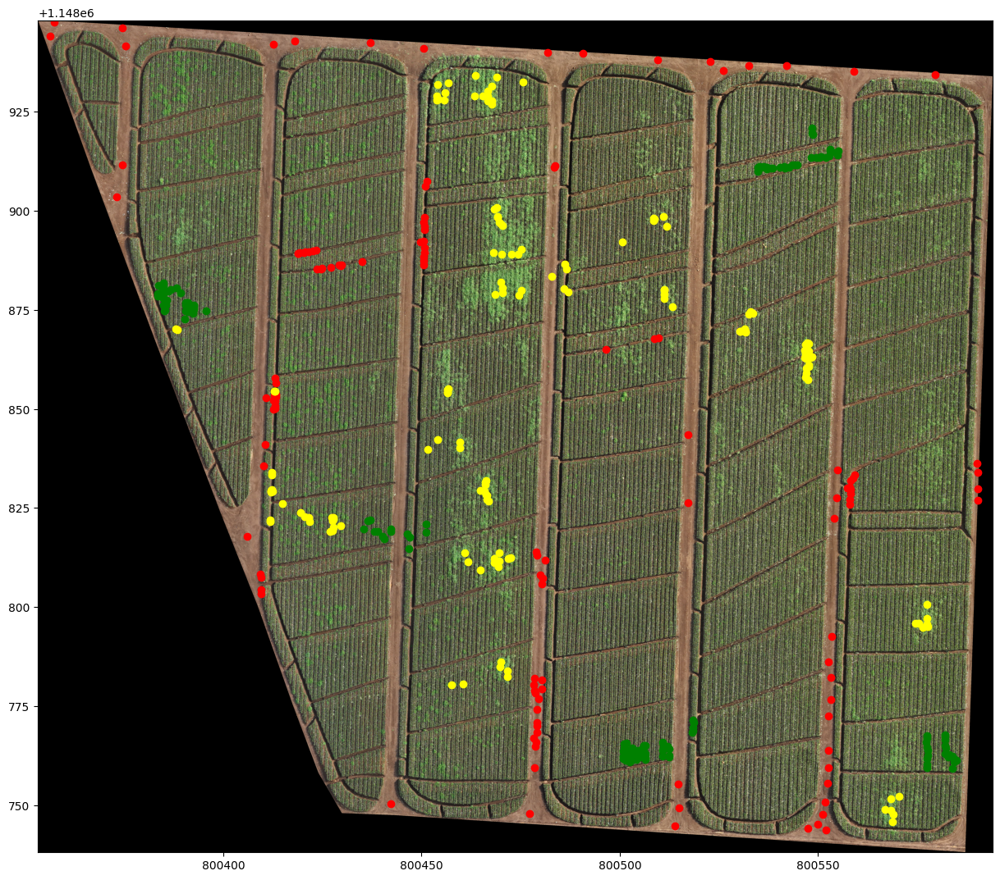

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
with rasterio.open(path_img) as src:
    gdf1 = gdf1.to_crs(src.crs.to_dict())
    gdf2 = gdf2.to_crs(src.crs.to_dict())
    gdf3 = gdf3.to_crs(src.crs.to_dict())
    show(src,ax=ax)
gdf1.plot(ax=ax, color='red')
gdf2.plot(ax=ax, color='green')
gdf3.plot(ax=ax, color='yellow')

In [ ]:
gdf1['id'] = 0
gdf2['id'] = 1

In [ ]:
gdf2

,id,geometry
0,1,POINT (800435.394 1148819.702)
1,1,POINT (800436.529 1148821.785)
2,1,POINT (800437.012 1148821.952)
3,1,POINT (800438.035 1148819.163)
4,1,POINT (800439.020 1148818.977)
...,...,...
146,1,POINT (800554.811 1148914.177)
147,1,POINT (800555.164 1148915.107)
148,1,POINT (800548.637 1148919.291)
149,1,POINT (800548.451 1148919.607)


In [ ]:
gdf = pd.concat([gdf1,gdf2], axis=0)
gdf

,id,geometry
0,0,POINT (800522.754 1148937.597)
1,0,POINT (800541.974 1148936.659)
2,0,POINT (800559.084 1148935.253)
3,0,POINT (800579.593 1148934.315)
4,0,POINT (800509.628 1148938.182)
...,...,...
146,1,POINT (800554.811 1148914.177)
147,1,POINT (800555.164 1148915.107)
148,1,POINT (800548.637 1148919.291)
149,1,POINT (800548.451 1148919.607)


In [ ]:
coord_list = [(x, y) for x, y in zip(gdf.geometry.x, gdf.geometry.y)]

In [ ]:
Values_list = []
Column_list = []
with rasterio.open(path_img) as src:
  Values = [x for x in src.sample(coord_list)]
  Values_list.append(Values)

In [ ]:
print(Values_list)

[[array([183, 145, 114, 255], dtype=uint8), array([187, 153, 121, 255], dtype=uint8), array([170, 136, 112, 255], dtype=uint8), array([188, 155, 125, 255], dtype=uint8), array([182, 148, 115, 255], dtype=uint8), array([203, 168, 138, 255], dtype=uint8), array([153, 118,  93, 255], dtype=uint8), array([167, 134, 109, 255], dtype=uint8), array([152, 119,  99, 255], dtype=uint8), array([157, 122,  97, 255], dtype=uint8), array([152, 118,  97, 255], dtype=uint8), array([155, 117,  88, 255], dtype=uint8), array([150, 111,  80, 255], dtype=uint8), array([172, 133, 101, 255], dtype=uint8), array([142,  97,  68, 255], dtype=uint8), array([141, 101,  78, 255], dtype=uint8), array([138, 101,  76, 255], dtype=uint8), array([141, 105,  76, 255], dtype=uint8), array([158, 118,  90, 255], dtype=uint8), array([148, 110,  82, 255], dtype=uint8), array([ 32,  25,  22, 255], dtype=uint8), array([ 29,  22,  16, 255], dtype=uint8), array([ 33,  26,  22, 255], dtype=uint8), array([ 41,  33,  31, 255], dtyp

In [ ]:
X = np.array(Values_list)
X = X[0].copy()
X = X[:,0:3].copy()

In [ ]:
X

array([[183, 145, 114],
       [187, 153, 121],
       [170, 136, 112],
       [188, 155, 125],
       [182, 148, 115],
       [203, 168, 138],
       [153, 118,  93],
       [167, 134, 109],
       [152, 119,  99],
       [157, 122,  97],
       [152, 118,  97],
       [155, 117,  88],
       [150, 111,  80],
       [172, 133, 101],
       [142,  97,  68],
       [141, 101,  78],
       [138, 101,  76],
       [141, 105,  76],
       [158, 118,  90],
       [148, 110,  82],
       [ 32,  25,  22],
       [ 29,  22,  16],
       [ 33,  26,  22],
       [ 41,  33,  31],
       [ 40,  18,  12],
       [ 42,  32,  23],
       [157, 116,  78],
       [ 38,  29,  25],
       [ 39,  30,  26],
       [158, 119,  93],
       [  0,   0,   0],
       [134,  96,  73],
       [146, 108,  83],
       [147, 107,  83],
       [154, 114,  90],
       [139, 103,  80],
       [160, 125, 103],
       [135,  98,  76],
       [132,  96,  77],
       [152, 116,  94],
       [152, 121, 102],
       [123,  91

In [ ]:
Y = gdf['id'].values
Y = Y[:,np.newaxis]

In [ ]:
df_X = pd.DataFrame(X, columns=['R', 'G', 'B'])  # Suponha que X tenha 3 colunas
df_Y = pd.DataFrame(Y, columns=['Target'])

# Combine os DataFrames X e Y em um único DataFrame
df_combined = pd.concat([df_X, df_Y], axis=1)

In [ ]:
df_combined

,R,G,B,Target
0,183,145,114,0
1,187,153,121,0
2,170,136,112,0
3,188,155,125,0
4,182,148,115,0
...,...,...,...,...
274,182,194,139,1
275,115,125,56,1
276,152,157,123,1
277,89,98,65,1


## Torch

In [ ]:
# Train/Test split
torch.manual_seed(1)
indices = torch.randperm(len(df_combined)).tolist()

train_size = int(0.8*len(df_combined))
df_train = df_combined.iloc[indices[:train_size]]
df_test  = df_combined.iloc[indices[train_size:]]

print(len(df_train), len(df_test))
display(df_train.head())

df_train.to_csv('veg_train.csv',index=False)
df_test.to_csv('veg_test.csv',index=False)
!ls

223 56


,R,G,B,Target
103,55,45,36,0
78,151,113,88,0
61,167,133,112,0
203,104,131,73,1
117,16,14,16,0


drive  sample_data  veg_test.csv  veg_train.csv


In [ ]:
class Vegetacao(Dataset):
  def __init__(self, csv_path, scaler_feat=None, scaler_label=None):

    self.dados = pd.read_csv(csv_path).to_numpy()

  def __getitem__(self, idx):

    sample = self.dados[idx][0:3]
    label  = self.dados[idx][-1:]

    # converte para tensor
    sample = torch.from_numpy(sample.astype(np.float32))
    label  = torch.from_numpy(label.astype(np.float32))

    return sample, label

  def __len__(self):
    return len(self.dados)

In [ ]:
dataset = Vegetacao('veg_train.csv')
dado, rotulo = dataset[0]
print(rotulo)
print(dado)

tensor([0.])
tensor([55., 45., 36.])


In [ ]:
dataset = Vegetacao('veg_train.csv')
dado, rotulo = dataset[1]
print(rotulo)
print(dado)

tensor([0.])
tensor([151., 113.,  88.])


In [ ]:
train_set = Vegetacao('veg_train.csv')
test_set  = Vegetacao('veg_test.csv')

print('Tamanho do treino: ' + str(len(train_set)) + ' amostras')
print('Tamanho do teste: ' + str(len(test_set)) + ' amostras')

Tamanho do treino: 223 amostras
Tamanho do teste: 56 amostras


In [ ]:
# Criando dataloader
train_loader = DataLoader(train_set,
                          args['batch_size'],
                          num_workers=args['num_workers'],
                          shuffle=True)
test_loader = DataLoader(test_set,
                         args['batch_size'],
                         num_workers=args['num_workers'],
                         shuffle=False)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
for batch in test_loader:

  dado, rotulo = batch
  print('## Dimensionalidade do batch ##')
  print(dado.size(), rotulo.size())

  break

## Dimensionalidade do batch ##
torch.Size([20, 3]) torch.Size([20, 1])


In [ ]:
train_set[0][0].size(0)

3

## IA

In [ ]:
#Rede usando Pytorch

class MLP(nn.Module):

  def __init__(self, input_size, hidden_size, out_size):
    super(MLP, self).__init__()

    self.features = nn.Sequential(
          nn.Linear(3, 256),
          nn.ReLU(),
          nn.Linear(256, 128),
          nn.ReLU(),
          nn.Linear(128, 64),
          nn.ReLU(),
          nn.Linear(64, 8),
          nn.ReLU()
    )

    self.classifier = nn.Sequential(
        nn.Linear(8, 1),
        nn.Sigmoid()
    )

  def forward(self, X):

    hidden = self.features(X)
    output = self.classifier(hidden)

    return output

input_size  = train_set[0][0].size(0)
hidden_size = 256
out_size    = 1

net = MLP(input_size, hidden_size, out_size).to(args['device'])
print(net)

MLP(
  (features): Sequential(
    (0): Linear(in_features=3, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=64, bias=True)
    (5): ReLU()
    (6): Linear(in_features=64, out_features=8, bias=True)
    (7): ReLU()
  )
  (classifier): Sequential(
    (0): Linear(in_features=8, out_features=1, bias=True)
    (1): Sigmoid()
  )
)


In [ ]:
criterion = nn.BCELoss().to(args['device'])
#criterion = nn.BCELoss()().to(args['device'])

optimizer = optim.Adam(net.parameters(), lr=args['lr'], weight_decay=args['weight_decay'])

In [ ]:
'''def train(train_loader, net, epoch):

  # Training mode
  net.train()

  start = time.time()

  epoch_loss  = []
  pred_list, rotulo_list = [], []

  for batch in train_loader:

    dado, rotulo = batch

    # Cast do dado na GPU
    dado = dado.to(args['device'])
    rotulo = rotulo.to(args['device'])

    # Forward
    ypred = net(dado)
    loss = criterion(ypred, rotulo)
    epoch_loss.append(loss.cpu().data)

    _, pred = torch.max(ypred, axis=1)

    binary_values = torch.round(_)
    numpy_array = binary_values.cpu().detach().numpy()

    #pred_listx.append(binary_values.cpu().numpy())
    pred_list.append(pred.cpu().numpy())
    rotulo_list.append(rotulo.cpu().numpy())

    # Backpropagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  epoch_loss = np.asarray(epoch_loss)
  pred_list = np.concatenate(pred_list)
  rotulo_list = np.concatenate(rotulo_list)

  print("--------Pred--------")
  print(type(pred))
  print(pred)
  print(pred.size())

  print("--------ypred--------")
  print(type(ypred))
  print(ypred)
  print(ypred.size())

  print("--------_--------")
  print(type(_))
  print(_)
  print(_.size())

  print("--------binary_values--------")
  print(type(binary_values))
  print(binary_values)
  print(binary_values.size())

  print("--------Rotulo_list--------")
  print(type(rotulo_list))
  print(rotulo_list)
  print(rotulo_list.shape)

  print("--------Pred_list--------")
  print(type(pred_list))
  print(pred_list)
  print(pred_list.shape)

  #ypred_binary = (ypred > 0.5).float().squeeze().cpu().numpy()
  #ypred_binary = np.round(ypred_binary)  # Arredonda para 0 ou 1

  ypred_binary = (pred_list > 0.5)
  acc = accuracy_score(pred_list, rotulo_list)

  #ypred_binary = (ypred > 0.5).float()
  #correct = (ypred_binary == rotulo.view(-1, 1)).sum().item()
  #total = rotulo.size(0)
  #acc = correct / total

  end = time.time()
  print('#################### Train ####################')
  print('Epoch %d, Loss: %.4f +/- %.4f, Acc: %.2f, Time: %.2f' % (epoch, epoch_loss.mean(), epoch_loss.std(), acc*100, end-start))

  return epoch_loss.mean(), acc'''

'def train(train_loader, net, epoch):\n\n  # Training mode\n  net.train()\n\n  start = time.time()\n\n  epoch_loss  = []\n  pred_list, rotulo_list = [], []\n\n  for batch in train_loader:\n\n    dado, rotulo = batch\n\n    # Cast do dado na GPU\n    dado = dado.to(args[\'device\'])\n    rotulo = rotulo.to(args[\'device\'])\n\n    # Forward\n    ypred = net(dado)\n    loss = criterion(ypred, rotulo)\n    epoch_loss.append(loss.cpu().data)\n\n    _, pred = torch.max(ypred, axis=1)\n\n    binary_values = torch.round(_)\n    numpy_array = binary_values.cpu().detach().numpy()\n\n    #pred_listx.append(binary_values.cpu().numpy())\n    pred_list.append(pred.cpu().numpy())\n    rotulo_list.append(rotulo.cpu().numpy())\n\n    # Backpropagation\n    optimizer.zero_grad()\n    loss.backward()\n    optimizer.step()\n\n  epoch_loss = np.asarray(epoch_loss)\n  pred_list = np.concatenate(pred_list)\n  rotulo_list = np.concatenate(rotulo_list)\n\n  print("--------Pred--------")\n  print(type(pred))\n

In [ ]:
'''def validate(test_loader, net, epoch):

  # Evaluation mode
  net.eval()

  start = time.time()

  epoch_loss  = []
  pred_list, rotulo_list = [], []

  with torch.no_grad():
    for batch in test_loader:

      dado, rotulo = batch

      # Cast do dado na GPU
      dado = dado.to(args['device'])
      rotulo = rotulo.to(args['device'])

      # Forward
      ypred = net(dado)
      loss = criterion(ypred, rotulo)
      epoch_loss.append(loss.cpu().data)

      _, pred = torch.max(ypred, axis=1)
      pred_list.append(pred.cpu().numpy())
      rotulo_list.append(rotulo.cpu().numpy())

  epoch_loss = np.asarray(epoch_loss)
  pred_list = np.concatenate(pred_list)
  rotulo_list = np.concatenate(rotulo_list)

  #ypred_binary = (pred_list > 0.5).float().squeeze().cpu().numpy()
  #ypred_binary = np.round(ypred_binary)  # Arredonda para 0 ou 1
  ypred_binary = (pred_list > 0.5)
  acc = accuracy_score(pred_list, rotulo_list)

  #ypred_binary = (ypred > 0.5).float()
  #correct = (ypred_binary == rotulo.view(-1, 1)).sum().item()
  #total = rotulo.size(0)
  #acc = correct / total

  end = time.time()
  print('********** Validate **********')
  print('Epoch %d, Loss: %.4f +/- %.4f, Acc: %.2f, Time: %.2f' % (epoch, epoch_loss.mean(), epoch_loss.std(), acc*100, end-start))

  return epoch_loss.mean(), acc'''

"def validate(test_loader, net, epoch):\n\n  # Evaluation mode\n  net.eval()\n\n  start = time.time()\n\n  epoch_loss  = []\n  pred_list, rotulo_list = [], []\n\n  with torch.no_grad():\n    for batch in test_loader:\n\n      dado, rotulo = batch\n\n      # Cast do dado na GPU\n      dado = dado.to(args['device'])\n      rotulo = rotulo.to(args['device'])\n\n      # Forward\n      ypred = net(dado)\n      loss = criterion(ypred, rotulo)\n      epoch_loss.append(loss.cpu().data)\n\n      _, pred = torch.max(ypred, axis=1)\n      pred_list.append(pred.cpu().numpy())\n      rotulo_list.append(rotulo.cpu().numpy())\n\n  epoch_loss = np.asarray(epoch_loss)\n  pred_list = np.concatenate(pred_list)\n  rotulo_list = np.concatenate(rotulo_list)\n\n  #ypred_binary = (pred_list > 0.5).float().squeeze().cpu().numpy()\n  #ypred_binary = np.round(ypred_binary)  # Arredonda para 0 ou 1\n  ypred_binary = (pred_list > 0.5)\n  acc = accuracy_score(pred_list, rotulo_list)\n\n  #ypred_binary = (ypred > 0.

In [ ]:
'''print("--------ypred--------")
  print(type(ypred))
  print(ypred)
  print(ypred.size())

  print("--------binary_predictions--------")
  print(type(binary_predictions))
  print(binary_predictions)
  print(binary_predictions.shape)

  print("--------pred_list--------")
  print(type(pred_list))
  print(len(pred_list))

  print(len(rotulo_list))'''

'print("--------ypred--------")\n  print(type(ypred))\n  print(ypred)\n  print(ypred.size())\n\n  print("--------binary_predictions--------")\n  print(type(binary_predictions))\n  print(binary_predictions)\n  print(binary_predictions.shape)\n\n  print("--------pred_list--------")\n  print(type(pred_list))\n  print(len(pred_list))\n\n  print(len(rotulo_list))'

In [ ]:
def train(train_loader, net, epoch):

  # Training mode
  net.train()

  start = time.time()

  epoch_loss  = []
  pred_list, rotulo_list = [], []

  for batch in train_loader:

    dado, rotulo = batch

    # Cast do dado na GPU
    dado = dado.to(args['device'])
    rotulo = rotulo.to(args['device'])

    # Forward
    ypred = net(dado)
    loss = criterion(ypred, rotulo)
    epoch_loss.append(loss.cpu().data)

    # Acuracia
    binary_predictions = (ypred > 0.5).int().cpu().numpy()
    pred_list.extend(binary_predictions)
    rotulo_list.append(rotulo.cpu().numpy())

    # Backpropagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  epoch_loss = np.asarray(epoch_loss)
  rotulo_list = np.concatenate(rotulo_list)

  acc = accuracy_score(rotulo_list, pred_list)

  end = time.time()
  print('#################### Train ####################')
  print('Epoch %d, Loss: %.4f +/- %.4f, Acc: %.2f, Time: %.2f' % (epoch, epoch_loss.mean(), epoch_loss.std(), acc*100, end-start))

  return epoch_loss.mean(), acc

In [ ]:
def validate(test_loader, net, epoch):

  # Evaluation mode
  net.eval()

  start = time.time()

  epoch_loss  = []
  pred_list, rotulo_list = [], []

  with torch.no_grad():
    for batch in test_loader:

      dado, rotulo = batch

      # Cast do dado na GPU
      dado = dado.to(args['device'])
      rotulo = rotulo.to(args['device'])

      # Forward
      ypred = net(dado)
      loss = criterion(ypred, rotulo)
      epoch_loss.append(loss.cpu().data)

      binary_predictions = (ypred > 0.5).int().cpu().numpy()
      pred_list.extend(binary_predictions)
      rotulo_list.append(rotulo.cpu().numpy())

  epoch_loss = np.asarray(epoch_loss)
  rotulo_list = np.concatenate(rotulo_list)

  acc = accuracy_score(rotulo_list, pred_list)

  end = time.time()
  print('********** Validate **********')
  print('Epoch %d, Loss: %.4f +/- %.4f, Acc: %.2f, Time: %.2f' % (epoch, epoch_loss.mean(), epoch_loss.std(), acc*100, end-start))

  return epoch_loss.mean(), acc

In [ ]:
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []
for epoch in range(args['epoch_num']):

    # Train
    train_loss, train_accuracy = train(train_loader, net, epoch)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # Validate
    test_loss, test_accuracy = validate(test_loader, net, epoch)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)

In [ ]:
plt.figure(figsize=(20, 9))
plt.plot(train_losses, label='Train')
plt.plot(test_losses, label='Test', linewidth=3, alpha=0.5)
plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Loss', fontsize=16)
plt.title('Convergence', fontsize=16)
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize=(20, 9))
plt.plot(train_accuracies, label='Train')
plt.plot(test_accuracies, label='Test', linewidth=3, alpha=0.5)
plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Acc', fontsize=16)
plt.title('Convergence', fontsize=16)
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

def validate_metrics(test_loader, net, epoch):
    # Evaluation mode
    net.eval()
    start = time.time()
    epoch_loss  = []
    pred_list, rotulo_list = [], []

    with torch.no_grad():
        for batch in test_loader:
            dado, rotulo = batch
            # Cast do dado na GPU
            dado = dado.to(args['device'])
            rotulo = rotulo.to(args['device'])
            # Forward
            ypred = net(dado)
            loss = criterion(ypred, rotulo)
            epoch_loss.append(loss.cpu().data)
            binary_predictions = (ypred > 0.5).int().cpu().numpy()
            pred_list.extend(binary_predictions)
            rotulo_list.append(rotulo.cpu().numpy())

    epoch_loss = np.asarray(epoch_loss)
    rotulo_list = np.concatenate(rotulo_list)

    acc = accuracy_score(rotulo_list, pred_list)

    end = time.time()
    print('********** Validate **********')
    print('Epoch %d, Loss: %.4f +/- %.4f, Acc: %.2f, Time: %.2f' % (epoch, epoch_loss.mean(), epoch_loss.std(), acc*100, end-start))

    # Calculando as métricas
    precision = precision_score(rotulo_list, pred_list)
    recall = recall_score(rotulo_list, pred_list)
    f1 = f1_score(rotulo_list, pred_list)
    conf_matrix = confusion_matrix(rotulo_list, pred_list)

    print("Tamanaho pred_list:", len(pred_list))

    print("Tamanaho rotulo_list:", len(rotulo_list))

    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)
    print("Confusion Matrix:\n", conf_matrix)

    return rotulo_list, pred_list


In [ ]:
rotulo_list, pred_list = validate_metrics(test_loader, net, epoch)

Após treinar e validar nosso modelo de IA, vamos agora aplicar à imagem completa, gerando assim uma mapa com as predições:

In [ ]:
path_img_test = '/content/drive/MyDrive/Formacoes/Geoprocessamento/Pinas/AOI_img.tif'
src = rasterio.open(path_img_test)
img = src.read()

In [ ]:
img.shape

In [ ]:
img = img.transpose([1,2,0])
img_size = (img.shape[0] , img.shape[1])
img = img.reshape(img.shape[0] * img.shape[1], img.shape[2])

In [ ]:
img_size

In [ ]:
img.shape

In [ ]:
df = pd.DataFrame(img, columns=['R','G','B','Mask'])

In [ ]:
df.head()

In [ ]:
df.shape

In [ ]:
print(df['Mask'].unique())

In [ ]:
print(df['Mask'].value_counts())

In [ ]:
del img, src

In [ ]:
df_to_pred = df[df['Mask'] == 255].copy()
values_to_pred = df_to_pred.values[:,0:3]

In [ ]:
df_to_pred.head()

In [ ]:
print(df_to_pred['Mask'].unique())

In [ ]:
values_to_pred

In [ ]:
values_to_pred.shape

In [ ]:
type(values_to_pred)

In [ ]:
df_to_pred.drop(columns={'R', 'G', 'B'}, inplace = True)
df.drop(columns={'R', 'G', 'B'}, inplace = True)

In [ ]:
df_to_pred.head()

In [ ]:
print(df_to_pred['Mask'].unique())

In [ ]:
df.head()

In [ ]:
print(df['Mask'].unique())

In [ ]:
print(df['Mask'].value_counts())

In [ ]:
print(df_to_pred['Mask'].value_counts())

In [ ]:
# Definindo o tamanho do lote menor
batch_size = 64  # ou qualquer outro valor menor

# Dividindo os dados em lotes menores
num_batches = len(values_to_pred) // batch_size
if len(values_to_pred) % batch_size != 0:
    num_batches += 1

# Mudando o modelo para o modo de avaliação
net.eval()

all_binary_predictions = []

# Loop sobre cada lote de dados
for i in range(num_batches):
    # Obtendo o lote atual
    batch_values = values_to_pred[i * batch_size: (i + 1) * batch_size]

    # Convertendo o lote para um tensor PyTorch
    values_tensor = torch.tensor(batch_values, dtype=torch.float32).to(args['device'])

    # Passando os valores através da rede neural
    with torch.no_grad():
        predictions = net(values_tensor)

    # Aplicando o threshold
    binary_predictions = (predictions > 0.5).int().cpu().numpy()

    # Adicionando as previsões binárias ao resultado final
    all_binary_predictions.extend(binary_predictions)

# Convertendo a lista de previsões binárias em um array numpy
all_binary_predictions = np.array(all_binary_predictions)

# Agora all_binary_predictions contém as previsões binárias para todos os dados
print("Binary Predictions:", all_binary_predictions.shape)

In [ ]:
type(all_binary_predictions)

In [ ]:
df_to_pred['pred'] = all_binary_predictions
df_to_pred

In [ ]:
print(df_to_pred['pred'].value_counts())

In [ ]:
del values_to_pred

In [ ]:
df = pd.merge(df,df_to_pred, how='left', left_index=True, right_index=True)

In [ ]:
df.head()

In [ ]:
print(df['Mask_x'].value_counts())

In [ ]:
print(df['Mask_y'].value_counts())

In [ ]:
print(df['pred'].value_counts())

In [ ]:
values_to_export = df['pred'].values

In [ ]:
values_to_export.shape

In [ ]:
values_to_export

In [ ]:
classify = values_to_export.reshape(img_size)
export_image = classify[np.newaxis,:,:]

In [ ]:
export_image.shape

In [ ]:
export_image

In [ ]:
print(type(export_image))

In [ ]:
export_image.dtype

In [ ]:
src = rasterio.open(path_img)
out_meta = src.meta.copy()
out_meta.update({"driver": "GTiff",
                  "height": export_image.shape[1],
                  "width": export_image.shape[2],
                  "compress":'lzw',
                  "nodata": np.nan,
                  "dtype": 'float64',
                  "count":1
                  })

In [ ]:
out_meta

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


<Axes: >

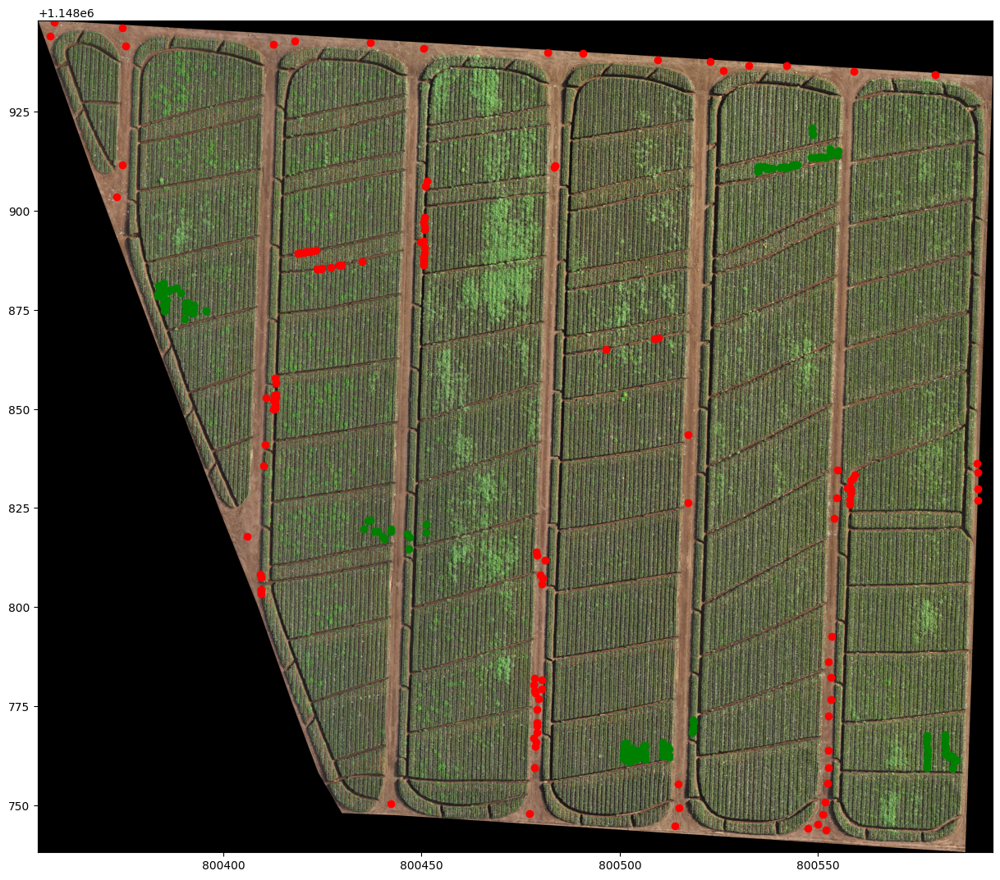

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
with rasterio.open(path_img) as src:
    gdf1 = gdf1.to_crs(src.crs.to_dict())
    gdf2 = gdf2.to_crs(src.crs.to_dict())
    #gdf3 = gdf3.to_crs(src.crs.to_dict())
    show(src,ax=ax)
gdf1.plot(ax=ax, color='red')
gdf2.plot(ax=ax, color='green')
#gdf3.plot(ax=ax, color='yellow')

In [ ]:
with rasterio.open('/content/mapa.tif', "w", **out_meta) as dest:
     dest.write(export_image)

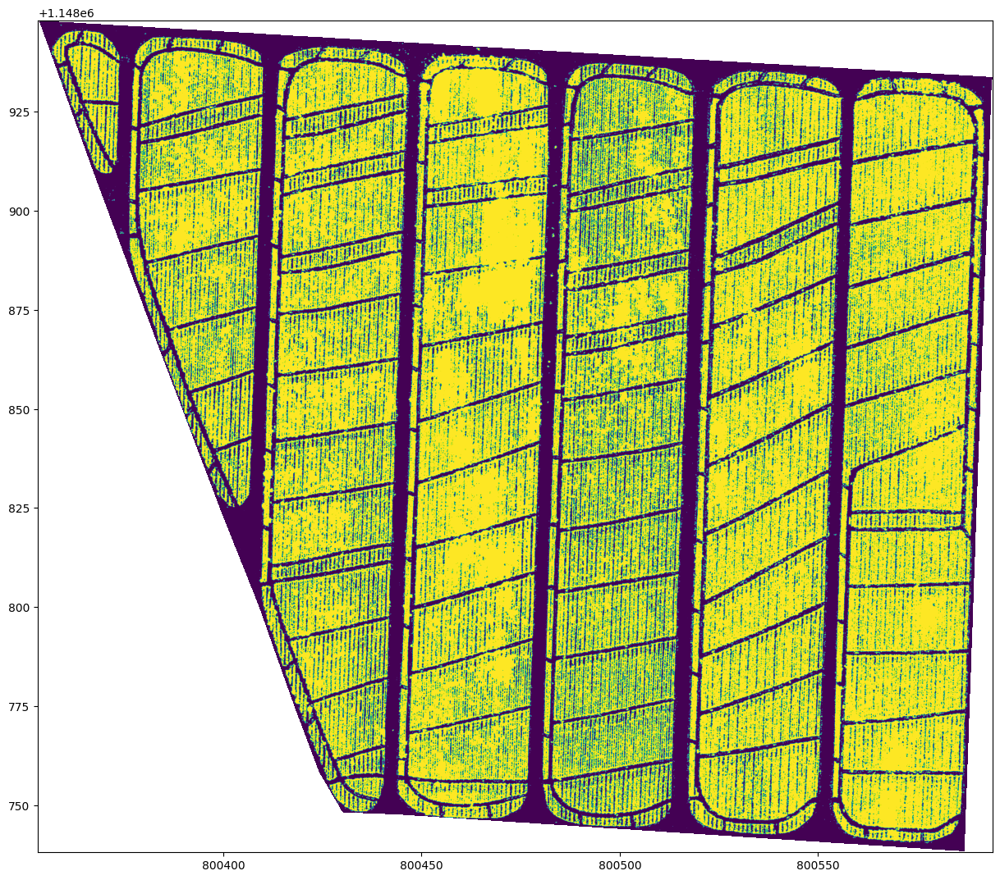

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
with rasterio.open('/content/mapa.tif') as dest:
     show(dest,ax=ax)

In [ ]:
path_img_mapa = '/content/mapa.tif'
src_mp = rasterio.open(path_img_mapa)
img_mp = src_mp.read()

In [ ]:
img_mp = img_mp.transpose([1,2,0])
img_size_mp = (img_mp.shape[0] , img_mp.shape[1])
img_mp = img_mp.reshape(img_mp.shape[0] * img_mp.shape[1], img_mp.shape[2])

In [ ]:
img_mp

array([[ 0.],
       [ 0.],
       [ 0.],
       ...,
       [nan],
       [nan],
       [nan]])

In [ ]:
img_mp.shape

(51650802, 1)

In [ ]:
df_mp = pd.DataFrame(img_mp, columns=['Pred'])

In [ ]:
df_mp.head()

,Pred
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0


In [ ]:
print(df_mp['Pred'].value_counts())

Pred
1.0    27053689
0.0    12982348
Name: count, dtype: int64


In [ ]:
print(df_mp.isnull().sum())

Pred    11614765
dtype: int64


In [ ]:
# Definir metadados para a imagem
height, width = export_image.shape[1:]
meta = {
    'driver': 'GTiff',
    'dtype': 'uint8',
    'width': width,
    'height': height,
    'count': 1,
    'compress': 'lzw',  # Opcional: compressão LZW para reduzir o tamanho do arquivo
    'nodata': None  # Opcional: valor de pixel de não-dados
}

# Escrever a imagem TIFF
with rasterio.open('/content/imagem.tif', 'w', **meta) as dst:
    dst.write(export_image)


/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = writer(
/usr/local/lib/python3.10/dist-packages/numpy/core/_asarray.py:126: RuntimeWarning: invalid value encountered in cast
  arr = array(a, dtype=dtype, order=order, copy=False, subok=subok)


/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


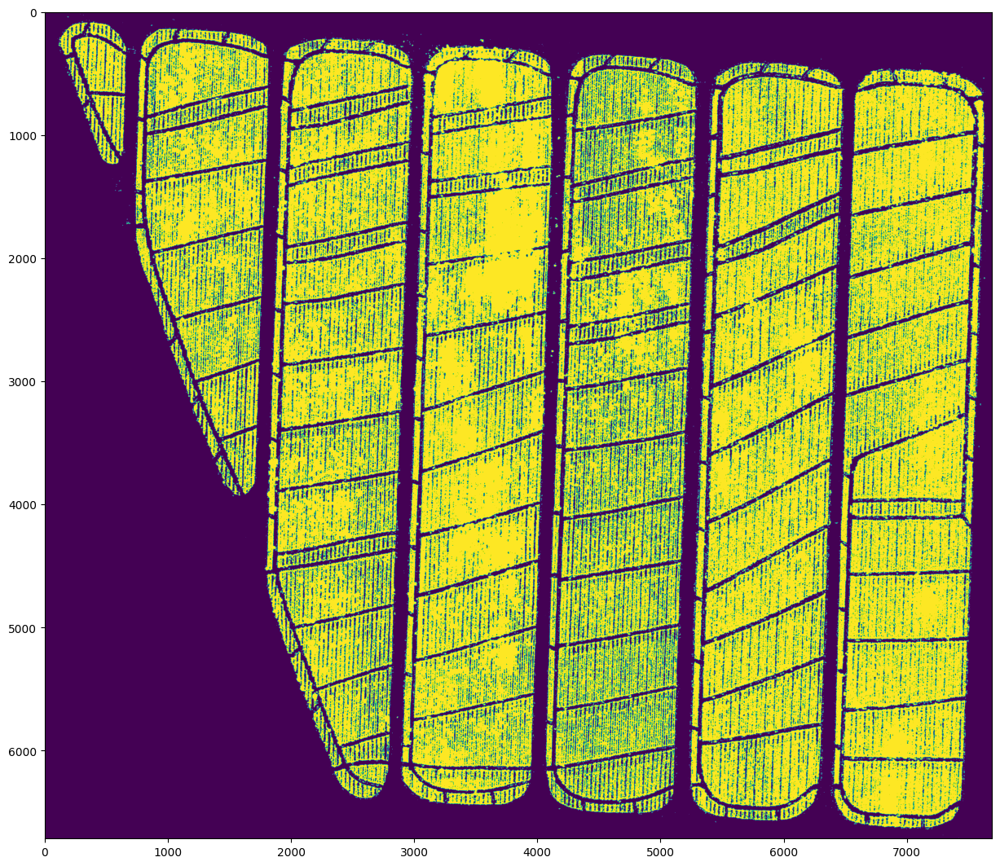

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
with rasterio.open('/content/imagem.tif') as dest:
     show(dest,ax=ax)

In [ ]:
pip install tifffile

In [ ]:
import tifffile

# Supondo que você tenha sua variável export_image
# export_image = sua_matriz_numpy

# Salve a matriz como uma imagem TIFF
tifffile.imwrite('test_imagem.tiff', export_image.astype(np.uint8))

<ipython-input-101-896b09d065ea>:7: RuntimeWarning: invalid value encountered in cast
  tifffile.imwrite('test_imagem.tiff', export_image.astype(np.uint8))


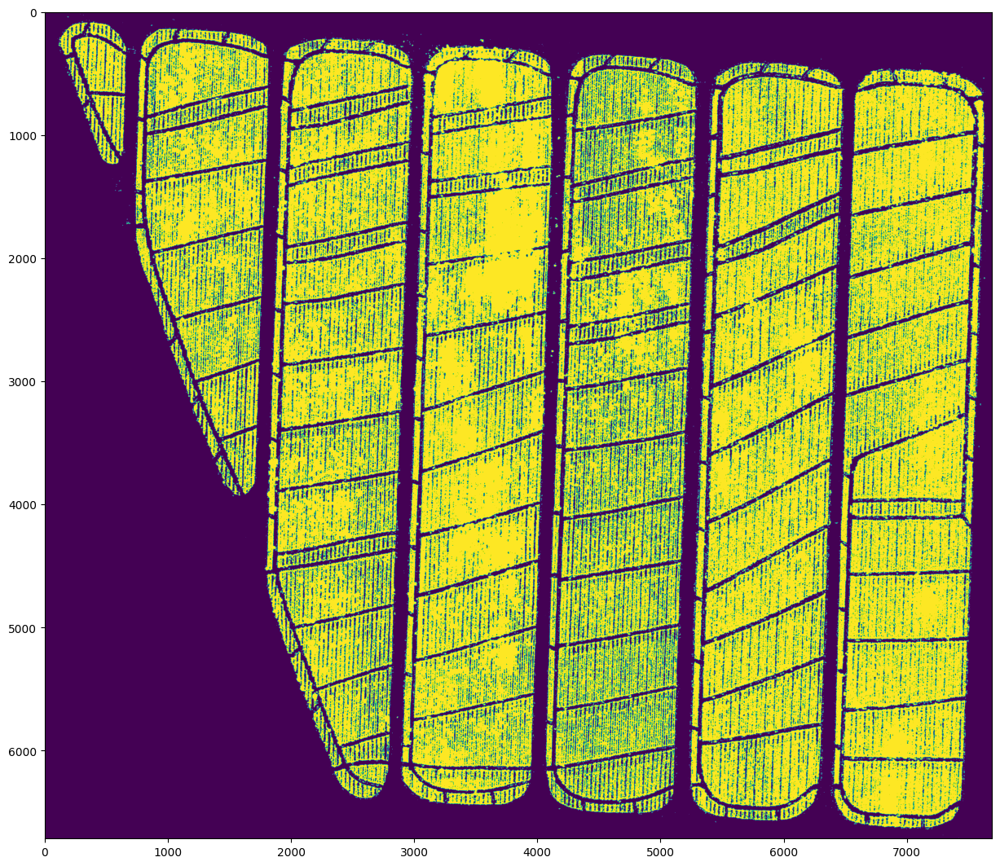

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
with rasterio.open('/content/test_imagem.tiff') as dest:
     show(dest,ax=ax)

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of 

<Axes: >

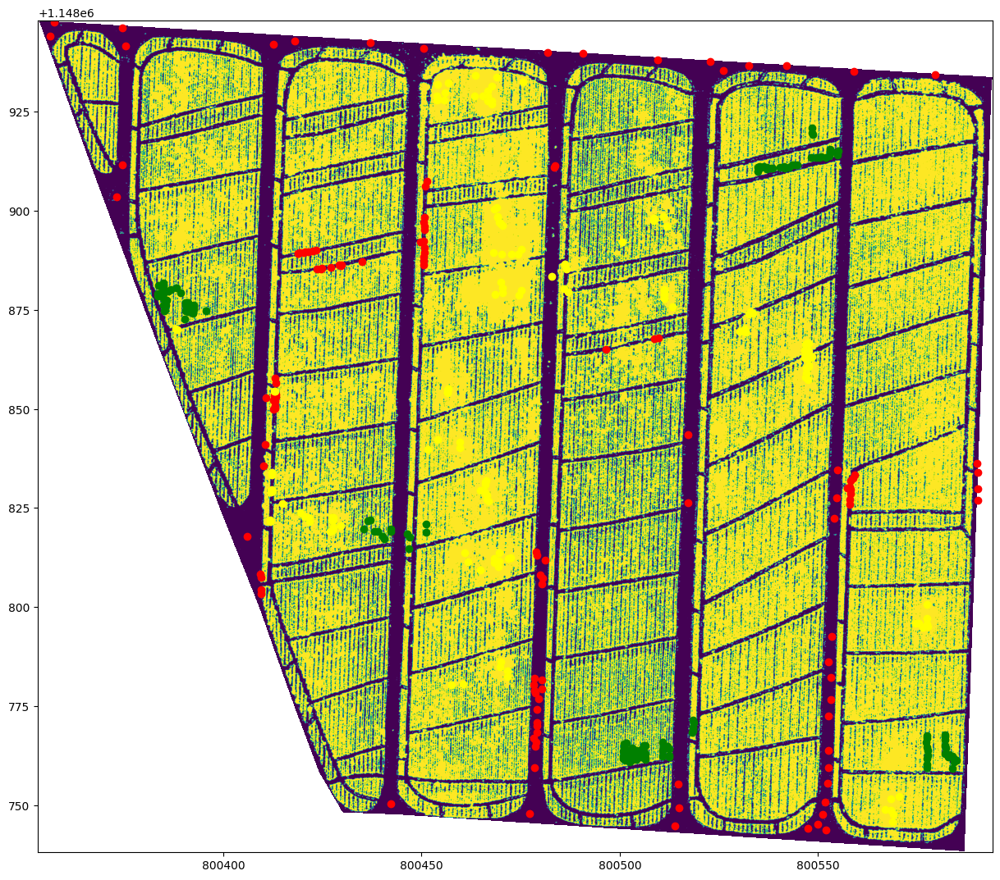

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
with rasterio.open('/content/mapa.tif') as src:
    gdf1 = gdf1.to_crs(src.crs.to_dict())
    gdf2 = gdf2.to_crs(src.crs.to_dict())
    gdf3 = gdf3.to_crs(src.crs.to_dict())
    show(src,ax=ax)
gdf1.plot(ax=ax, color='red')
gdf2.plot(ax=ax, color='green')
gdf3.plot(ax=ax, color='yellow')